In [26]:
#https://www.fao.org/faostat/en/#data
#Libraries
import pandas as pd
import numpy as np
from pathlib import Path #this library minimizes issues when using paths in Mac
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#pip freeze > requirements.txt

In [3]:
#Seaborn Context
sns.set_theme(style='whitegrid', context='talk', palette='deep')
#plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1));
#sns.set_palette(['#62C370', '#FFD166', '#EF476F'])# Plot
#plt.figure(figsize=(9, 5)) 

In [6]:
prod_df = pd.read_csv(prod_folder /"Value_of_Production_E_All_Data.csv", encoding = 'unicode_escape')
prod_df.head()

,Area Code,Area Code (M49),Area,Item Code,Item Code (CPC),Item,Element Code,Element,Unit,Y1961,...,Y2016,Y2016F,Y2017,Y2017F,Y2018,Y2018F,Y2019,Y2019F,Y2020,Y2020F
0,2,'004,Afghanistan,221,'01371,"Almonds, in shell",152,Gross Production Value (constant 2014-2016 tho...,1000 Int. $,NaN,...,166057.0,E,137986.0,E,173995.0,E,193168.0,E,198739.0,E
1,2,'004,Afghanistan,221,'01371,"Almonds, in shell",56,Gross Production Value (current thousand SLC),1000 SLC,NaN,...,6539411.0,E,5213293.0,E,6239642.0,E,6707803.0,E,7160695.0,E
2,2,'004,Afghanistan,221,'01371,"Almonds, in shell",55,Gross Production Value (constant 2014-2016 tho...,1000 SLC,NaN,...,7004306.0,E,5820251.0,E,7339134.0,E,8147840.0,E,8382859.0,E
3,2,'004,Afghanistan,711,'01654,"Anise, badian, coriander, cumin, caraway, fenn...",152,Gross Production Value (constant 2014-2016 tho...,1000 Int. $,NaN,...,37675.0,E,41176.0,E,39326.0,E,39392.0,E,39965.0,E
4,2,'004,Afghanistan,515,'01341,Apples,152,Gross Production Value (constant 2014-2016 tho...,1000 Int. $,7127.0,...,66506.0,E,80449.0,E,102515.0,E,118153.0,E,127845.0,E


In [10]:
drop_columns = ["Area Code (M49)", "Area Code", "Item Code", "Element", "Element Code", "Unit"]
pop_df = clean_fao_df(pop_df, 'Total Population - Both sexes', drop_columns, 'Total_Population' )
pop_df=pop_df[pop_df["Year"]==2019]
pop_df = pop_df[pop_df.columns.drop(['Item', 'Year'])]
pop_df.head()

,Area,Total_Population
69,Afghanistan,37769.499
220,Albania,2873.883
371,Algeria,42705.368
522,American Samoa,47.321
673,Andorra,76.343


In [11]:
prod_df=prod_df.merge(pop_df, how='left', on='Area') 

In [12]:
prod_df['Prod_Capita']=prod_df['Total_Prod']/prod_df['Total_Population']
prod_df = prod_df[prod_df.columns.drop(['Total_Prod', 'Total_Population'])]

In [13]:
prod_df.head()

,Area,Item,Prod_Capita
0,Afghanistan,"Almonds, in shell",5.114391
1,Afghanistan,"Anise, badian, coriander, cumin, caraway, fenn...",1.042958
2,Afghanistan,Apples,3.128265
3,Afghanistan,Apricots,2.805306
4,Afghanistan,Barley,0.637446


In [14]:
prod_df=prod_df.pivot(index='Area', columns='Item', values='Prod_Capita')

In [15]:
prod_df=prod_df.reset_index(level=0)

In [16]:
#Noticed that there are Areas that are not countries, but groups of them ("World", "Americas", etc.)
#Downloaded the groups file to remove them at once
pop_group_df = pd.read_csv(pop_folder /"Population_E_All_Area_Groups_NOFLAG.csv", encoding = 'unicode_escape')

In [17]:
prod_df = prod_df[~prod_df['Area'].isin(pop_group_df['Area'].unique())] 

In [18]:
prod_df.head()

Item,Area,"Abaca, manila hemp, raw","Agave fibres, raw, n.e.c.",Agriculture,"Almonds, in shell","Anise, badian, coriander, cumin, caraway, fennel and juniper berries, raw",Apples,Apricots,Areca nuts,Artichokes,...,Unmanufactured tobacco,"Vanilla, raw",Vegetables Primary,Vegetables and Fruit Primary,Vetches,"Walnuts, in shell",Watermelons,Wheat,Yams,Yautia
0,Afghanistan,NaN,NaN,174.078401,5.114391,1.042958,3.128265,2.805306,NaN,NaN,...,NaN,NaN,12.133944,62.010804,NaN,1.22771,5.202902,30.662361,NaN,NaN
2,Albania,NaN,NaN,736.821228,NaN,NaN,17.398412,1.389409,NaN,NaN,...,1.093294,NaN,151.655095,307.200398,0.251924,NaN,20.965711,19.218945,NaN,NaN
3,Algeria,NaN,NaN,364.737754,8.573185,NaN,6.176483,4.012376,NaN,1.941981,...,0.795263,NaN,73.969390,159.457167,0.000679,NaN,11.989523,21.499944,NaN,NaN
5,Angola,NaN,NaN,190.689824,NaN,NaN,NaN,NaN,NaN,NaN,...,0.201152,NaN,6.316054,63.896623,NaN,NaN,NaN,0.021667,NaN,NaN
6,Antigua and Barbuda,NaN,NaN,92.230533,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6.622013,64.928298,NaN,NaN,NaN,NaN,0.390807,NaN


In [19]:
print("There are:",prod_df.shape[1]-1, "products")
print("The Products with most null values are:")
print(prod_df.isnull().sum().sort_values(ascending=False).head(10))


There are: 199 products
The Products with most null values are:
Item
Meat of other domestic camelids, fresh or chilled (indigenous)    209
Kapok fruit                                                       209
Maté leaves                                                       208
Meat of mules, fresh or chilled (indigenous)                      208
Quinoa                                                            208
Brazil nuts, in shell                                             208
Other sugar crops n.e.c.                                          208
Ramie, raw or retted                                              208
Poppy seed                                                        207
Peppermint, spearmint                                             207
dtype: int64


In [20]:
prod_df.dropna(thresh=len(prod_df)/2, axis=1, inplace=True)

In [21]:
print("There are:",prod_df.shape[1]-1, "products")
print("The Products with most null values are:")
print(prod_df.isnull().sum().sort_values(ascending=False).head(10))


There are: 44 products
The Products with most null values are:
Item
Lemons and limes                 105
Sweet potatoes                   103
Sorghum                          101
Groundnuts, excluding shelled    101
Other pulses n.e.c.              100
Raw milk of goats                100
Rice                              94
Oranges                           93
Watermelons                       92
Pumpkins, squash and gourds       91
dtype: int64


In [22]:
prod_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Item,,,,,,,,
Agriculture,200.0,453.758783,413.902520,5.844922,180.182081,359.323199,579.551421,3525.971994
Bananas,120.0,14.165875,29.901647,0.000056,1.419063,4.878865,9.878197,204.910221
Cabbages,148.0,1.838997,2.426568,0.000000,0.364526,0.948169,2.391735,18.691916
Carrots and turnips,129.0,2.024548,2.865467,0.001301,0.388080,1.177787,2.629596,23.212063
"Cereals, Total",180.0,77.019542,97.848773,0.002793,11.489062,39.850869,94.290468,415.269755
"Chillies and peppers, green (Capsicum spp. and Pimenta spp.)",127.0,3.657267,6.806096,0.002630,0.422305,1.398182,3.559124,58.869744
Crops,200.0,263.359651,216.981025,1.435973,101.828947,208.534091,372.056938,1177.121821
Cucumbers and gherkins,133.0,2.524720,3.541211,0.000000,0.326451,1.021511,3.016062,18.507537
Food,200.0,437.701205,405.218041,5.844922,170.205037,331.585928,542.409365,3407.324693


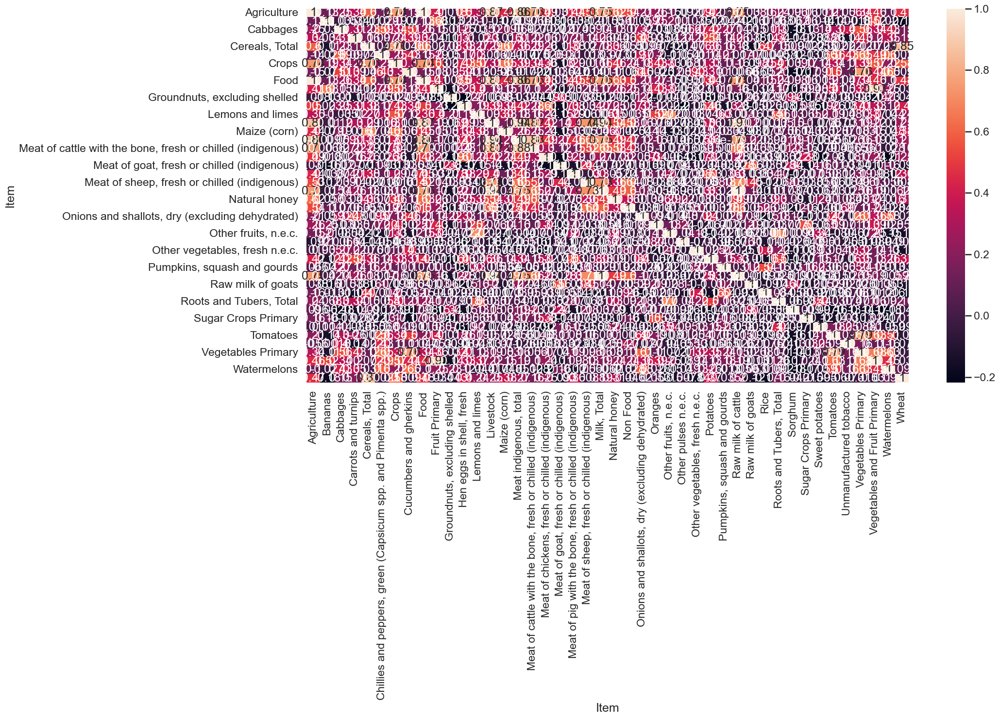

In [27]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(prod_df.corr(),annot = True)
plt.show()

In [28]:
#featurewiz does not work for clustering or unsupervised problems
#pip install featurewiz --user

In [29]:
prod_df.fillna(0, inplace=True)

In [30]:
prod_df.set_index('Area', inplace=True)
prod_df.head()

Item,Agriculture,Bananas,Cabbages,Carrots and turnips,"Cereals, Total","Chillies and peppers, green (Capsicum spp. and Pimenta spp.)",Crops,Cucumbers and gherkins,Food,Fruit Primary,...,"Roots and Tubers, Total",Sorghum,Sugar Crops Primary,Sweet potatoes,Tomatoes,Unmanufactured tobacco,Vegetables Primary,Vegetables and Fruit Primary,Watermelons,Wheat
Area,,,,,,,,,,,,,,,,,,,,,
Afghanistan,174.078401,0.000000,0.000000,0.000000,36.263282,0.000000,116.927365,0.000000,170.163867,49.876860,...,6.103549,0.000000,0.054991,0.000000,0.000000,0.000000,12.133944,62.010804,5.202902,30.662361
Albania,736.821228,0.000000,5.575036,1.305203,49.112995,19.863717,438.875208,16.485013,731.203045,155.545650,...,22.699254,0.000000,0.503500,0.000000,49.646071,1.093294,151.655095,307.200398,20.965711,19.218945
Algeria,364.737754,0.002014,0.620344,2.715115,29.452386,10.610352,252.020542,1.454641,360.776659,85.487778,...,29.420493,0.004707,0.000000,0.000000,16.476664,0.795263,73.969390,159.457167,11.989523,21.499944
Angola,190.689824,44.369762,2.378747,0.000000,18.371780,0.000000,154.329529,0.000000,188.052620,57.580569,...,54.670691,0.216576,1.040472,10.732844,0.245970,0.201152,6.316054,63.896623,0.000000,0.021667
Antigua and Barbuda,92.230533,0.575355,0.173692,0.553644,0.108558,0.542788,67.164584,0.325673,91.199236,58.306284,...,1.107287,0.000000,0.000000,0.401663,1.541518,0.000000,6.622013,64.928298,0.000000,0.000000


In [31]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns # data visualization library  
import os
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from yellowbrick.cluster import KElbowVisualizer
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from sklearn.decomposition import PCA

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LassoCV

import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [32]:
#https://www.kaggle.com/code/emilytries/clustering-and-feature-selection
def outlier_thresholds(dataframe, variable):
    quartile1 = dataframe[variable].quantile(0.01)
    quartile3 = dataframe[variable].quantile(0.99)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit


def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit
    
for col in prod_df.columns:
    replace_with_thresholds(prod_df, col)

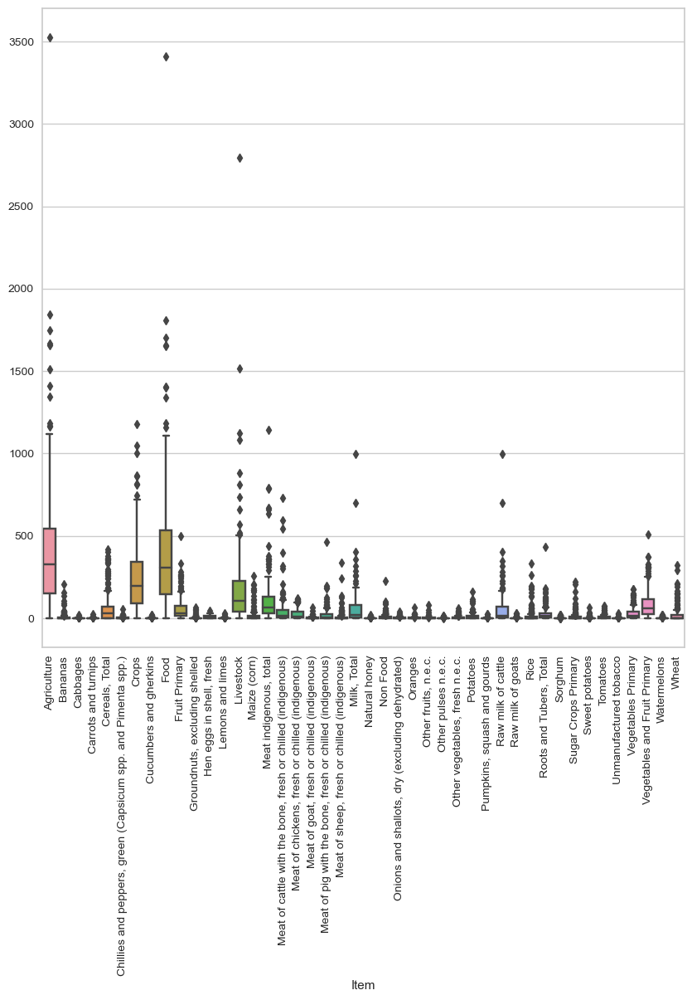

In [33]:
plt.figure(figsize=(10,10))
sns.boxplot(data=prod_df)
plt.xticks(rotation=90)
plt.show()

In [34]:
# Min Max Scaler
names = prod_df.columns
indexes = prod_df.index
sc = MinMaxScaler((0, 1))
df = sc.fit_transform(prod_df)
data_scaled = pd.DataFrame(df, columns=names, index=indexes)
data_scaled.head()

Item,Agriculture,Bananas,Cabbages,Carrots and turnips,"Cereals, Total","Chillies and peppers, green (Capsicum spp. and Pimenta spp.)",Crops,Cucumbers and gherkins,Food,Fruit Primary,...,"Roots and Tubers, Total",Sorghum,Sugar Crops Primary,Sweet potatoes,Tomatoes,Unmanufactured tobacco,Vegetables Primary,Vegetables and Fruit Primary,Watermelons,Wheat
Area,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.049370,0.000000,0.000000,0.000000,0.087325,0.000000,0.099333,0.000000,0.049941,0.100151,...,0.014064,0.000000,0.000250,0.000000,0.000000,0.000000,0.068742,0.121600,0.248162,0.095964
Albania,0.208970,0.000000,0.298259,0.056230,0.118268,0.378461,0.372838,0.890719,0.214597,0.312330,...,0.052303,0.000000,0.002287,0.000000,0.677845,0.039340,0.859169,0.602402,1.000000,0.060149
Algeria,0.103443,0.000010,0.033188,0.116970,0.070924,0.202158,0.214099,0.078597,0.105883,0.171657,...,0.067790,0.000243,0.000000,0.000000,0.224965,0.028616,0.419057,0.312686,0.571863,0.067288
Angola,0.054081,0.216533,0.127261,0.000000,0.044241,0.000000,0.131108,0.000000,0.055191,0.115620,...,0.125971,0.011160,0.004726,0.162796,0.003358,0.007238,0.035782,0.125298,0.000000,0.000068
Antigua and Barbuda,0.026157,0.002808,0.009292,0.023852,0.000261,0.010342,0.057058,0.017597,0.026766,0.117077,...,0.002551,0.000000,0.000000,0.006092,0.021047,0.000000,0.037516,0.127321,0.000000,0.000000


C:\Users\blancc2\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


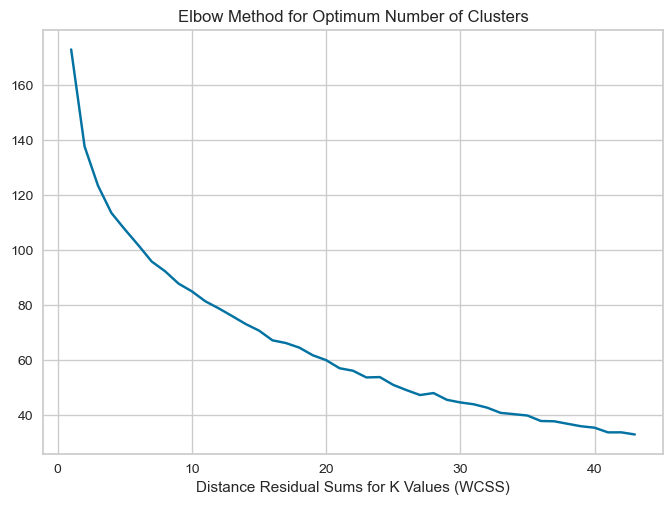

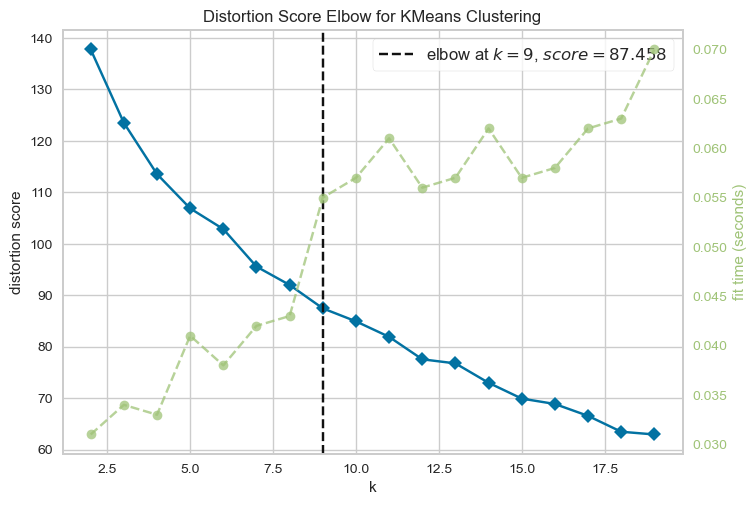

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [35]:
# KMeans Clustering
#https://www.scikit-yb.org/en/latest/api/cluster/elbow.html
kmeans = KMeans()
ssd = []
K = range(1, 44)

for k in K:
    kmeans = KMeans(n_clusters=k).fit(data_scaled)
    ssd.append(kmeans.inertia_)

ssd

plt.plot(K, ssd, "bx-")
plt.xlabel("Distance Residual Sums for K Values (WCSS)")
plt.title("Elbow Method for Optimum Number of Clusters")
plt.show()

kmeans = KMeans()
visu = KElbowVisualizer(kmeans, k=(2, 20))
visu.fit(df)
visu.show()

In [48]:
kmeans = KMeans(n_clusters=9).fit(data_scaled)
clusters = kmeans.labels_

pd.DataFrame({"Customers": prod_df.index, "Clusters": clusters})
prod_df["cluster_no"] = clusters
prod_df.head()

Item,Agriculture,Bananas,Cabbages,Carrots and turnips,"Cereals, Total","Chillies and peppers, green (Capsicum spp. and Pimenta spp.)",Crops,Cucumbers and gherkins,Food,Fruit Primary,...,Sorghum,Sugar Crops Primary,Sweet potatoes,Tomatoes,Unmanufactured tobacco,Vegetables Primary,Vegetables and Fruit Primary,Watermelons,Wheat,cluster_no
Area,,,,,,,,,,,,,,,,,,,,,
Afghanistan,174.078401,0.000000,0.000000,0.000000,36.263282,0.000000,116.927365,0.000000,170.163867,49.876860,...,0.000000,0.054991,0.000000,0.000000,0.000000,12.133944,62.010804,5.202902,30.662361,2
Albania,736.821228,0.000000,5.575036,1.305203,49.112995,19.863717,438.875208,16.485013,731.203045,155.545650,...,0.000000,0.503500,0.000000,49.646071,1.093294,151.655095,307.200398,20.965711,19.218945,6
Algeria,364.737754,0.002014,0.620344,2.715115,29.452386,10.610352,252.020542,1.454641,360.776659,85.487778,...,0.004707,0.000000,0.000000,16.476664,0.795263,73.969390,159.457167,11.989523,21.499944,4
Angola,190.689824,44.369762,2.378747,0.000000,18.371780,0.000000,154.329529,0.000000,188.052620,57.580569,...,0.216576,1.040472,10.732844,0.245970,0.201152,6.316054,63.896623,0.000000,0.021667,2
Antigua and Barbuda,92.230533,0.575355,0.173692,0.553644,0.108558,0.542788,67.164584,0.325673,91.199236,58.306284,...,0.000000,0.000000,0.401663,1.541518,0.000000,6.622013,64.928298,0.000000,0.000000,2


In [49]:
prod_df["cluster_no"] = prod_df["cluster_no"] + 1
prod_df.groupby("cluster_no").agg({"cluster_no": "count"})

Item,cluster_no
cluster_no,
1,5
2,39
3,83
4,18
5,16
6,1
7,10
8,8
9,31


In [50]:
prod_df.groupby("cluster_no").agg(np.mean)

Item,Agriculture,Bananas,Cabbages,Carrots and turnips,"Cereals, Total","Chillies and peppers, green (Capsicum spp. and Pimenta spp.)",Crops,Cucumbers and gherkins,Food,Fruit Primary,...,"Roots and Tubers, Total",Sorghum,Sugar Crops Primary,Sweet potatoes,Tomatoes,Unmanufactured tobacco,Vegetables Primary,Vegetables and Fruit Primary,Watermelons,Wheat
cluster_no,,,,,,,,,,,,,,,,,,,,,
1,721.883176,123.779656,0.725091,1.310698,11.529689,1.679644,577.281863,1.505611,705.829158,288.691877,...,131.079284,0.034122,12.486988,7.759198,1.583984,0.560967,19.121367,307.813244,1.056580,0.013849
2,405.862199,8.159957,1.539810,1.648653,46.028997,1.670679,195.074034,1.883459,387.547830,47.368374,...,15.975071,0.378428,20.668110,0.465537,5.697258,0.496818,26.704783,74.073156,1.399157,18.334676
3,148.144747,5.569209,0.351090,0.210254,11.228806,0.313290,91.053920,0.288793,143.159067,24.252774,...,14.886937,0.658780,1.300023,2.145645,1.566608,0.692608,8.343265,32.596587,0.391117,1.882894
4,1206.797555,1.292653,2.076069,2.426625,300.831582,2.285494,659.499608,1.526443,1186.662985,58.939348,...,33.568669,2.537311,21.376338,0.574663,6.919449,1.541059,27.769516,86.708805,1.746382,136.028527
5,662.950279,4.088723,1.908830,1.771316,82.872076,8.572821,455.381134,3.414528,649.999102,166.621242,...,15.209290,0.876727,9.138543,0.460470,34.610836,1.012150,79.049864,245.671020,6.044213,25.991154
6,3525.971994,0.000000,3.419618,4.233687,43.675442,0.417622,402.917988,0.043960,3407.324693,258.049854,...,26.762470,0.000000,0.000000,0.494048,5.145559,0.000000,70.813388,328.863242,0.116353,19.011767
7,739.172974,0.584973,6.733558,7.887081,88.269159,11.379811,403.654188,11.660568,710.357538,79.769552,...,50.339254,0.121404,5.710667,1.489943,25.914173,3.794117,120.875572,200.645089,10.525262,39.416758
8,358.941566,4.584536,0.688731,0.366606,57.576186,1.514449,225.622521,1.052139,342.982948,33.953937,...,17.852457,15.885249,6.001680,1.671559,5.385302,0.158795,28.987349,62.941284,1.155240,1.114774
9,416.093752,5.461636,1.134757,0.477647,95.188680,1.738561,297.375066,0.763219,387.091752,43.761890,...,42.053575,0.818560,17.431869,3.709137,5.613938,1.943602,30.794570,74.556459,1.586543,10.015723


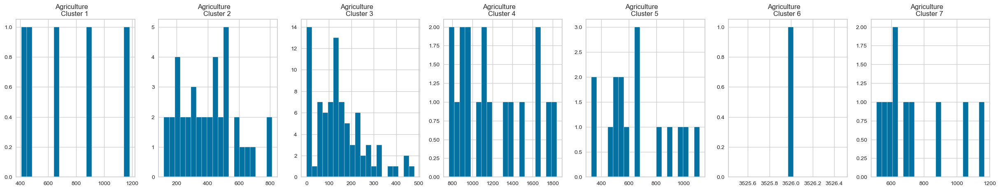

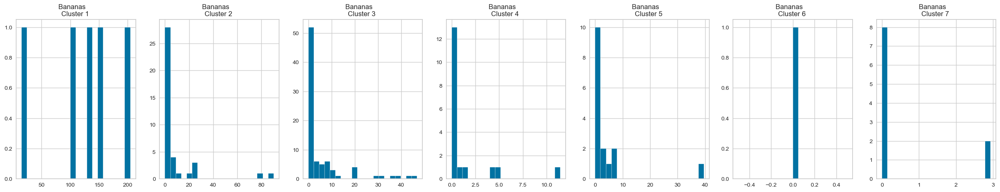

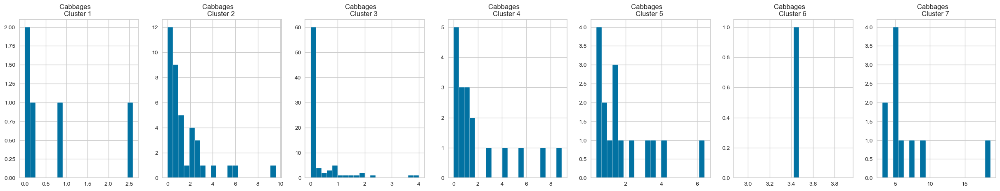

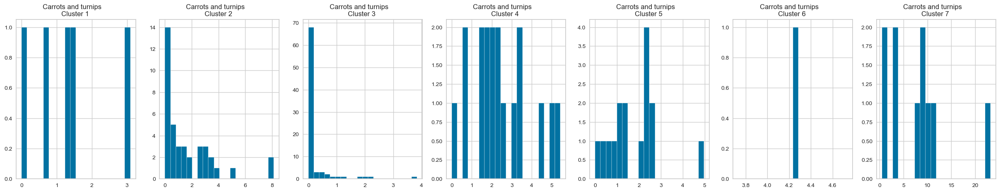

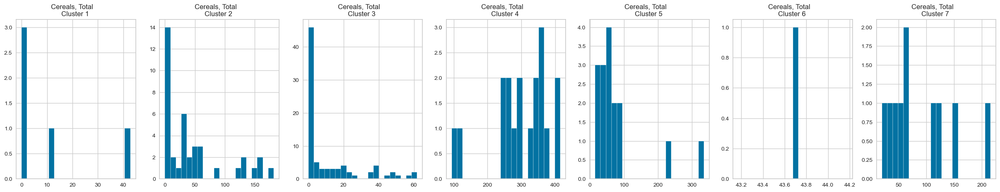

...

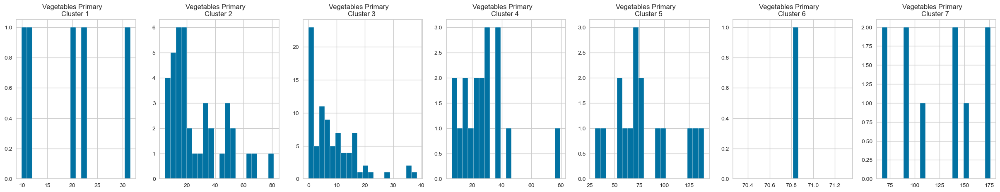

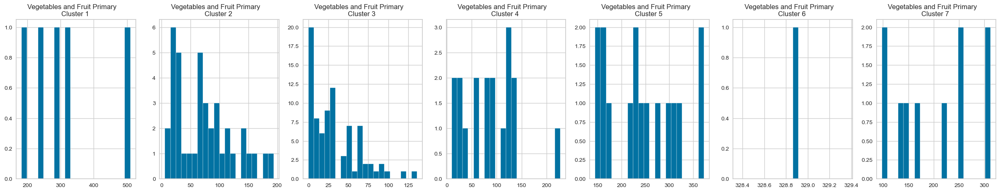

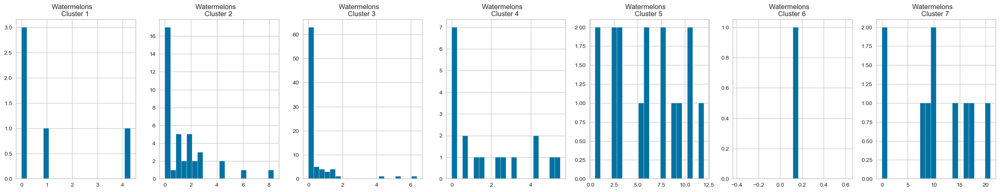

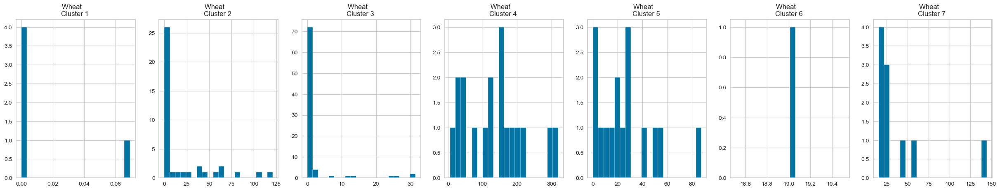

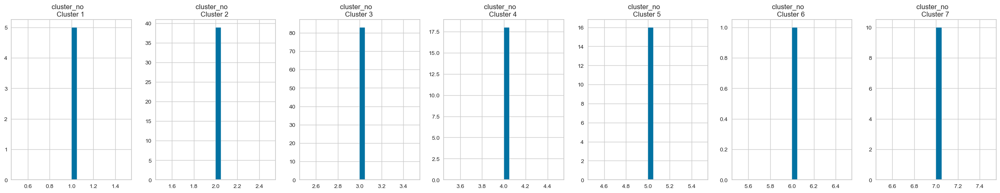

In [51]:
for i in prod_df.columns:
  plt.figure(figsize = (35, 5))
  for j in range(1,8):
    plt.subplot(1,8,j+1)
    cluster = prod_df[prod_df['cluster_no'] == j]
    cluster[i].hist(bins = 20)
    plt.title('{}    \nCluster {} '.format(i,j))
  
  plt.show()

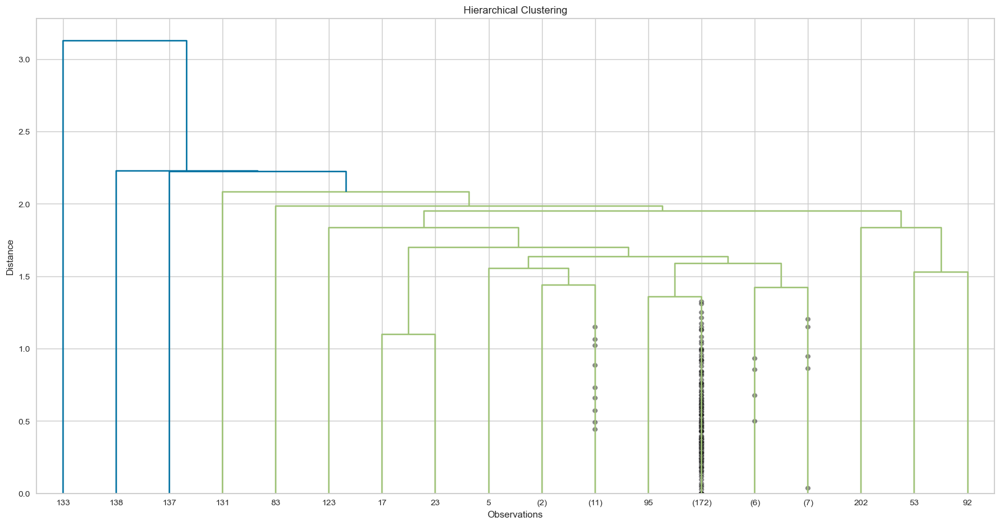

In [52]:
# Average Linkage Method
hc_average = linkage(data_scaled, "average")

plt.figure(figsize=(20, 10))
plt.title("Hierarchical Clustering")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_average,
           leaf_font_size=10, 
           p=10,
           show_contracted=True,
          truncate_mode='level')
plt.show()

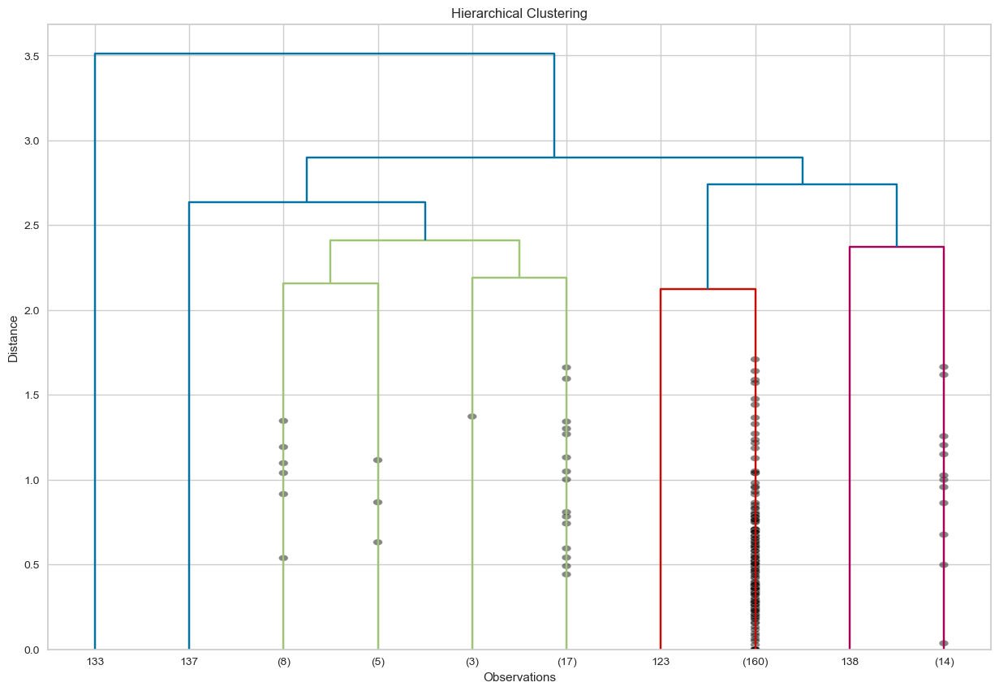

In [53]:
# Complete Linkage Method
hc_complete = linkage(data_scaled, "complete")

plt.figure(figsize=(15, 10))
plt.title("Hierarchical Clustering")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_complete,
           truncate_mode="lastp",
           p=10,
           show_contracted=True,
           leaf_font_size=10)
plt.show()

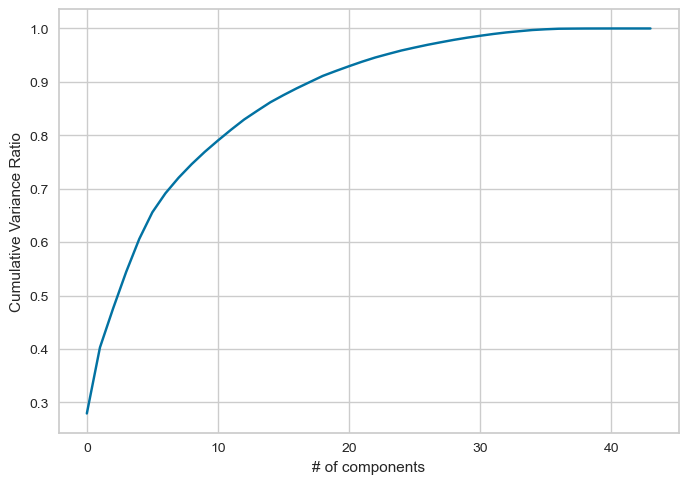

In [54]:
pca = PCA().fit(data_scaled)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("# of components")
plt.ylabel("Cumulative Variance Ratio")
plt.show()

In [55]:
for i in range(prod_df.shape[1]-1):
    pca = PCA(n_components=i)
    pca_fit = pca.fit_transform(data_scaled)
    print(i, pca.explained_variance_ratio_.sum())

0 0.0
1 0.2791121834799882
2 0.40261974386790433
3 0.47545496899405837
4 0.5441040402443734
5 0.6059082170812086
6 0.6558603872654419
7 0.6915045991948875
8 0.720523807164966
9 0.7459884213554197
10 0.769045705857887
11 0.79017636897612
12 0.810342206243453
13 0.8294981550660485
14 0.8458669526393646
15 0.8618024358406423
16 0.8751911569531775
17 0.8878067853297328
18 0.89955825268539
19 0.9111691916087997
20 0.9204337470875078
21 0.929322031534072
22 0.9378179109212631
23 0.9456308436357718
24 0.9523102509562118
25 0.95876529575896
26 0.9642313784794138
27 0.9694573516528415
28 0.974158341520885
29 0.9786815476147801
30 0.9827114035405614
31 0.9863052727470302
32 0.9896516996823086
33 0.9925821473095158
34 0.9948914669684159
35 0.9971221053182682
36 0.9984821291129012
37 0.9994996720778289
38 0.9997293017870293
39 0.9998940526033429
40 0.9999479112962568
41 0.9999818439458764
42 0.999999926263228
43 0.9999999998901562


In [83]:
pca = PCA(n_components=18)
pca_fit = pca.fit_transform(data_scaled)
pca.explained_variance_ratio_

array([0.27911218, 0.12350756, 0.07283523, 0.06864907, 0.06180418,
       0.04995217, 0.03564421, 0.02901921, 0.02546461, 0.02305728,
       0.02113066, 0.02016584, 0.01915595, 0.0163688 , 0.01593548,
       0.01338872, 0.01261563, 0.01175147])

In [85]:
#Only for easy visualization, we pick 2 variables.
pca = PCA(n_components=2)
pca_fit = pca.fit_transform(data_scaled)
pca.explained_variance_ratio_

array([0.27911218, 0.12350756])

In [86]:
# Convert to a data frame
X_reduceddf = pd.DataFrame(pca_fit, index=data_scaled.index, columns=['PC1','PC2'])
X_reduceddf['cluster'] = clusters
X_reduceddf.head()

,PC1,PC2,cluster
Area,,,
Afghanistan,-0.329754,0.078341,2
Albania,0.995919,1.289567,6
Algeria,0.192519,0.526475,4
Angola,-0.366333,-0.005501,2
Antigua and Barbuda,-0.415416,0.034930,2


In [110]:
#https://github.com/OpenClassrooms-Student-Center/Multivariate-Exploratory-Analysis/blob/master/functions.py
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    '''Display a scatter plot on a factorial plane, one for each factorial plane'''

    # For each factorial plane
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # Initialise the matplotlib figure      
            fig = plt.figure(figsize=(7,6))
        
            # Display the points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # Display the labels on the points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # Define the limits of the chart
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # Display grid lines
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # Label the axes, with the percentage of variance explained
            plt.xlabel('PC{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('PC{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection of points (on PC{} and PC{})".format(d1+1, d2+1))
            #plt.show(block=False)
            
def display_parallel_coordinates_centroids(df, num_clusters):
    '''Display a parallel coordinates plot for the centroids in df'''

    # Create the plot
    fig = plt.figure(figsize=(12, 5))
    title = fig.suptitle("Parallel Coordinates plot for the Centroids", fontsize=18)
    fig.subplots_adjust(top=0.9, wspace=0)

    # Draw the chart
    parallel_coordinates(df, 'cluster', color=palette)

    # Stagger the axes
    ax=plt.gca()
    for tick in ax.xaxis.get_major_ticks()[1::2]:
        tick.set_pad(20)    

C:\Users\blancc2\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but PCA was fitted with feature names



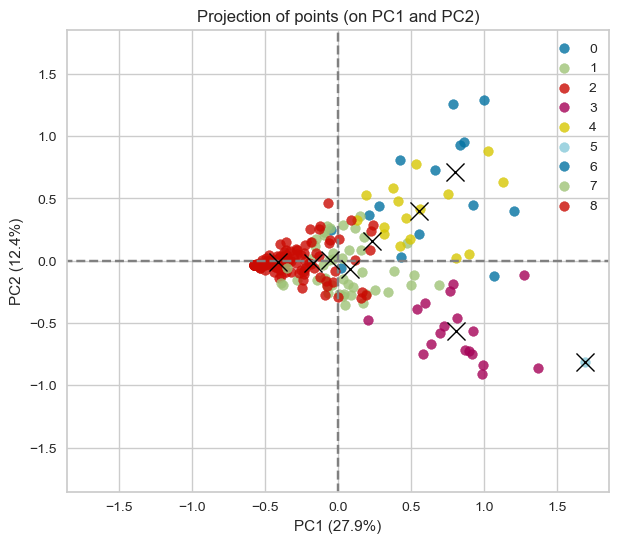

In [111]:
from sklearn.decomposition import PCA
centres_reduced = pca.transform(kmeans.cluster_centers_)
display_factorial_planes(pca_fit, 2, pca, [(0,1)], illustrative_var = clusters, alpha = 0.8)
plt.scatter(centres_reduced[:, 0], centres_reduced[:, 1],
            marker='x', s=169, linewidths=1,
            color='black', zorder=10)

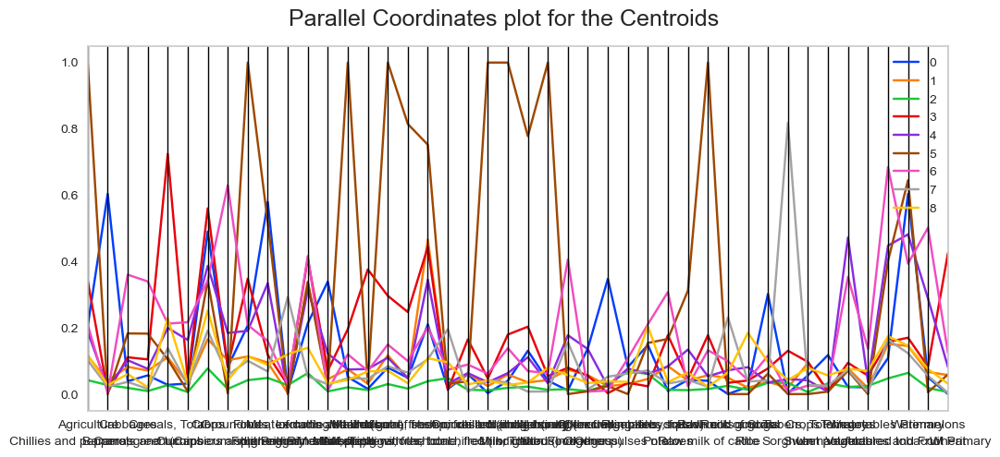

In [112]:
from pandas.plotting import parallel_coordinates
palette = sns.color_palette("bright", 10)


# Add the cluster number to the original scaled data
X_clustered = pd.DataFrame(data_scaled, index=data_scaled.index, columns=data_scaled.columns)
X_clustered["cluster"] = clusters
means =  X_clustered.groupby(by="cluster").mean()
display_parallel_coordinates_centroids(means.reset_index(), 5)

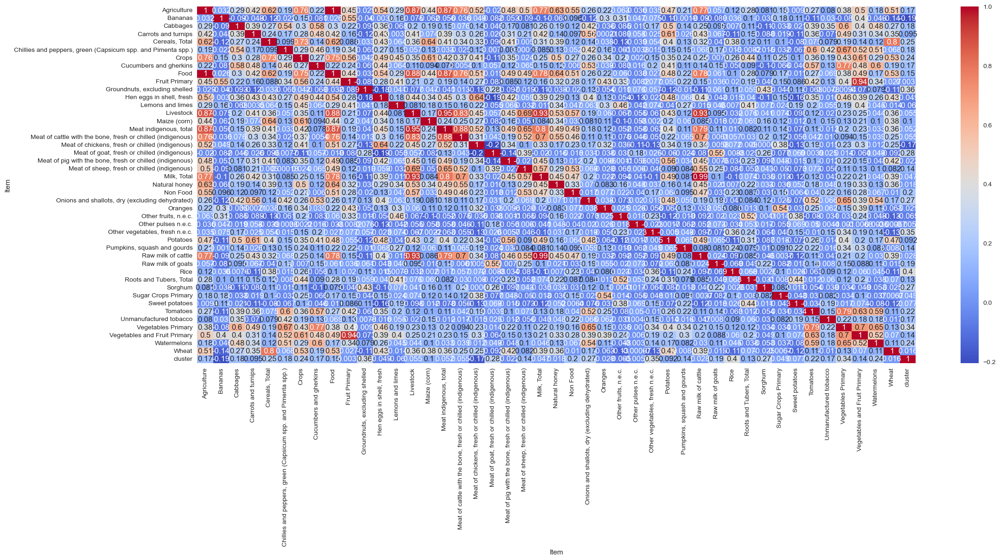

In [114]:
plt.figure(figsize=(25,10))
cor = data_scaled.corr()
sns.heatmap(cor, annot=True, cmap='coolwarm')
plt.show()

In [119]:
def get_redundant_pairs(df):
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

print("Top Absolute Correlations")
print(get_top_abs_correlations(data_scaled, 20))

Top Absolute Correlations
Item                    Item                                                       
Agriculture             Food                                                           0.997159
Milk, Total             Raw milk of cattle                                             0.993677
Livestock               Meat indigenous, total                                         0.949254
Fruit Primary           Vegetables and Fruit Primary                                   0.935454
Livestock               Milk, Total                                                    0.931501
                        Raw milk of cattle                                             0.929071
Meat indigenous, total  Meat of cattle with the bone, fresh or chilled (indigenous)    0.879048
Food                    Livestock                                                      0.875986
Agriculture             Livestock                                                      0.874848
                        Me

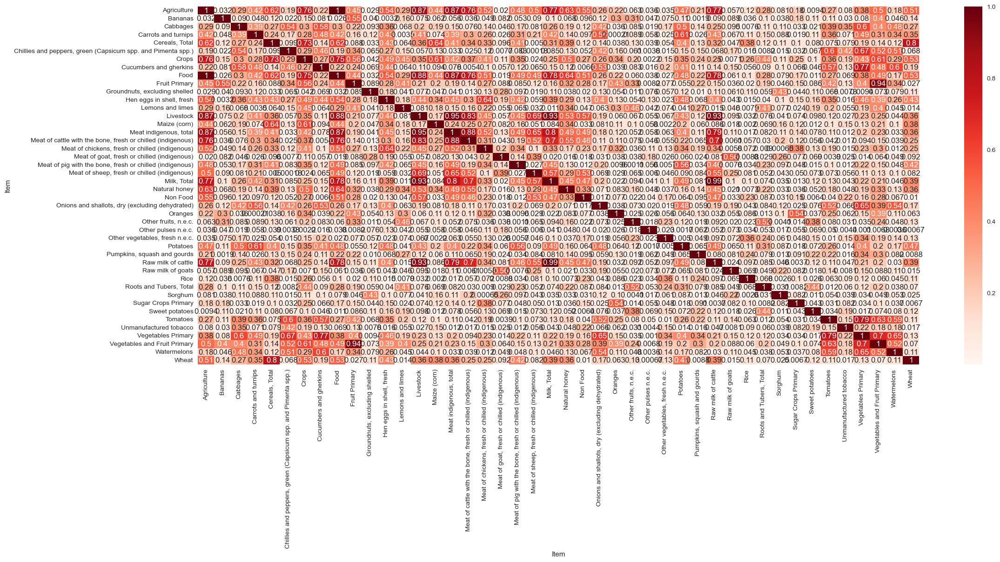

In [58]:
plt.figure(figsize=(25,10))
cor = data_scaled.corr().abs()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [59]:
upper_tri = cor.where(np.triu(np.ones(cor.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.85)]
print(); print(to_drop)
prod_df = prod_df.drop(prod_df.columns[to_drop], axis=1)
#print(); print(prod_df.head())


['Food', 'Livestock', 'Meat indigenous, total', 'Meat of cattle with the bone, fresh or chilled (indigenous)', 'Milk, Total', 'Raw milk of cattle', 'Vegetables and Fruit Primary']


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [60]:
prod_df.columns

Index(['Agriculture', 'Bananas', 'Cabbages', 'Carrots and turnips',
       'Cereals, Total',
       'Chillies and peppers, green (Capsicum spp. and Pimenta spp.)', 'Crops',
       'Cucumbers and gherkins', 'Food', 'Fruit Primary',
       'Groundnuts, excluding shelled', 'Hen eggs in shell, fresh',
       'Lemons and limes', 'Livestock', 'Maize (corn)',
       'Meat indigenous, total',
       'Meat of cattle with the bone, fresh or chilled (indigenous)',
       'Meat of chickens, fresh or chilled (indigenous)',
       'Meat of goat, fresh or chilled (indigenous)',
       'Meat of pig with the bone, fresh or chilled (indigenous)',
       'Meat of sheep, fresh or chilled (indigenous)', 'Milk, Total',
       'Natural honey', 'Non Food',
       'Onions and shallots, dry (excluding dehydrated)', 'Oranges',
       'Other fruits, n.e.c.', 'Other pulses n.e.c.',
       'Other vegetables, fresh n.e.c.', 'Potatoes',
       'Pumpkins, squash and gourds', 'Raw milk of cattle',
       'Raw milk of g

In [61]:
codes_df = pd.read_csv(pop_folder /"Population_E_AreaCodes.csv", encoding = 'unicode_escape')

In [62]:
prod_df=prod_df.merge(codes_df, on='Area')

In [69]:
import country_converter as coco
cc = coco.CountryConverter()
prod_df['iso']=cc.pandas_convert(prod_df['Area'], to='ISO3')

Belgium-Luxembourg not found in regex
Serbia and Montenegro not found in regex
USSR not found in regex
Yugoslav SFR not found in regex


In [64]:
pd.set_option('display.max_rows', None)

In [65]:
import plotly.express as px

In [66]:
fig = px.choropleth(prod_df, 
                    locations=prod_df['iso'], 
                    color="cluster_no",
                     hover_name="cluster_no",
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

In [93]:

cluster_ire=prod_df['cluster_no'][prod_df['Area']=='Spain'].values[0]
print("Regions in the same cluster than Ireland: \n")
#use to_string function to remove the "Name", "Dtype" from the output. 
print(prod_df['Area'][prod_df['cluster_no']==cluster_ire].to_string(index=False))

Regions in the same cluster than Ireland: 

                   Algeria
                   Armenia
                Azerbaijan
                     Chile
        Dominican Republic
                     Egypt
                    Greece
                    Guyana
Iran (Islamic Republic of)
                     Italy
                    Mexico
                  Portugal
       Republic of Moldova
                     Spain
                   Tunisia
                   Türkiye


In [68]:
prod_df

,Area,Agriculture,Bananas,Cabbages,Carrots and turnips,"Cereals, Total","Chillies and peppers, green (Capsicum spp. and Pimenta spp.)",Crops,Cucumbers and gherkins,Food,...,Tomatoes,Unmanufactured tobacco,Vegetables Primary,Vegetables and Fruit Primary,Watermelons,Wheat,cluster_no,Area Code,M49 Code,iso
0,Afghanistan,174.078401,0.000000,0.000000,0.000000,36.263282,0.000000,116.927365,0.000000,170.163867,...,0.000000,0.000000,12.133944,62.010804,5.202902,30.662361,3,2,'004,AFG
1,Albania,736.821228,0.000000,5.575036,1.305203,49.112995,19.863717,438.875208,16.485013,731.203045,...,49.646071,1.093294,151.655095,307.200398,20.965711,19.218945,7,3,'008,ALB
2,Algeria,364.737754,0.002014,0.620344,2.715115,29.452386,10.610352,252.020542,1.454641,360.776659,...,16.476664,0.795263,73.969390,159.457167,11.989523,21.499944,5,4,'012,DZA
3,Angola,190.689824,44.369762,2.378747,0.000000,18.371780,0.000000,154.329529,0.000000,188.052620,...,0.245970,0.201152,6.316054,63.896623,0.000000,0.021667,3,7,'024,AGO
4,Antigua and Barbuda,92.230533,0.575355,0.173692,0.553644,0.108558,0.542788,67.164584,0.325673,91.199236,...,1.541518,0.000000,6.622013,64.928298,0.000000,0.000000,3,8,'028,ATG
5,Argentina,1744.827348,1.400565,0.000000,1.780469,399.957873,2.214322,1177.121821,0.000000,1701.221150,...,7.002958,5.384383,30.400876,136.759881,0.657585,102.997172,4,9,'032,ARG
6,Armenia,541.152562,0.000000,6.414588,1.290505,15.329706,0.000000,278.224294,5.854779,539.040602,...,26.802789,0.751967,71.042990,220.039906,10.525767,9.456137,5,1,'051,ARM
7,Australia,1509.816316,4.349500,0.723464,3.428498,254.473192,1.172528,630.132503,0.225262,1402.276161,...,6.180974,0.226642,28.311203,118.938825,1.508015,164.357576,4,10,'036,AUS
8,Austria,704.273340,0.000000,1.537510,3.367027,129.367090,1.132102,260.721581,1.907220,703.689439,...,3.127499,0.000000,23.984622,75.836436,0.036262,42.589252,2,11,'040,AUT
9,Azerbaijan,531.992026,0.000000,3.302337,1.177787,74.132347,3.384036,307.724715,9.099702,498.171118,...,32.468486,1.321736,69.485797,152.640839,7.942046,48.930430,5,52,'031,AZE
